In [1]:
import sys
sys.path.append("../")
sys.path.append("../simulation")

In [2]:
import pandas as pd
import plotly.graph_objects as go
from plotting import CandlePlot
import numpy as np

from simulation.supertrend_markov_binance import SupertrendTradeStrategy

from functools import reduce


In [3]:

from multiprocessing import Process, Manager
import pickle
import warnings
warnings.filterwarnings('ignore')

In [4]:
def run_pair(symbol,
             granularity,
             lenght=10000,
             strategy=1,
             tp = 0.005,
            sl = 0.005,
             timeframe=1
            ):
    df = pd.read_pickle(f"crypto/{symbol}_{granularity}.pkl")

    df['time'] = df['Time'].copy()
    df['strategy'] = 0
    # dff['returns'] = dff['Close'].pct_change()
    df['returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['creturns'] = df['returns'].cumsum()
    df['Log_Returns'] = np.log(df['Close'] / df['Close'].shift(1))
    df['cLog_Returns'] = df['Log_Returns'].cumsum()

    # df = df.iloc[lenght:]
    # df = df[df['Time'] >= lenght]
    
    df.dropna(inplace=True)
    
    df.reset_index(drop=True, inplace=True)

    gt = SupertrendTradeStrategy(
        df,
        strategy,
        tp,
        sl,
        timeframe,
        tc=-0.0005
    )
    
    gt.run_test()
    return gt
    

In [75]:
# symbols = ['BTCUSDT','VIDTUSDT', 'XLMUSDT', 'ACHUSDT','ADAUSDT','DOTUSDT']


In [76]:
# df.columns

In [82]:
def get_list_args():
    args_dic_list = []
    for symbol in symbols:
        for granularity in ['1h']:
            for lenght in ['2023-01-01 00:00:00']:
                for strategy in [1]:
                    for tp in [0.01]:
                        for sl in [0.01]:
                            for timeframe in [2,5,10,15,60]:
                                args_dic = {
                                    "symbol": symbol,
                                    "granularity": granularity,
                                    "lenght": lenght,
                                    "strategy": strategy,
                                    "tp": tp,
                                    "sl": sl,
                                    "timeframe":timeframe
                                }
                                args_dic_list.append(args_dic)
    return args_dic_list


In [83]:

def run_process(L, arg):
    # print("PROCESS",arg)
    L.append(
        dict(
            arg=arg,
            symbol=arg['symbol'],
            granularity=arg['granularity'],
            lenght = arg['lenght'],
            tp = arg['tp'],
            sl = arg['sl'],
            timeframe = arg['timeframe'],
            res=run_pair(
                symbol=arg['symbol'],
                granularity=arg['granularity'],
                lenght = arg['lenght'],
                strategy= arg['strategy'],
                tp = arg['tp'],
                sl = arg['sl'],
                timeframe = arg['timeframe']
            )
        )
    )


lista = []
def run_ema_macd():
    with Manager() as manager:
        global lista
        L = manager.list()  # Lista compartilhada entre processos
        args_list = get_list_args()
        print(len(args_list))
        limit = 10
        current = 0
    
        while current < len(args_list):
            print(current)
            processes = []
            todo = len(args_list) - current
            if todo < limit:
                limit = todo
    
            for _ in range(limit):
                processes.append(Process(target=run_process, args=(L, args_list[current])))
                current += 1
    
            for p in processes:
                p.start()
    
            for p in processes:
                p.join()

        print("ALL DONE")
        lista = list(L)

        

In [84]:
%%time

run_ema_macd()

5
0
ALL DONE
CPU times: user 3.12 ms, sys: 60.7 ms, total: 63.8 ms
Wall time: 361 ms


In [85]:


# ddf = lista[0]['res'].df.copy()

In [86]:
# with open(f"./result-pair-trading-new-data-strategy-1-CPA-with-sl-0.05-1min-2023-to-end.pkl", "wb") as f:
#     pickle.dump(lista, f)  # Usa o pickle para salvar o arquivo



In [87]:
# ddf.Trend_15.value_counts()

In [88]:
# cp = CandlePlot(ddf.iloc[-10000:],candles=False)


# trades_up = cp.df_plot[cp.df_plot.SIGNAL_UP == 1]

# trades_down = cp.df_plot[cp.df_plot.SIGNAL_DOWN == 1]

# print(len(trades_up),len(trades_down))

In [89]:

# marker_trade_up = '#abebc6'
# marker_trade_down = '#cccddd'


# markers = 'Close'


# cp.add_traces(['Close'])


# # # SIGNAL UP
# cp.fig.add_trace(go.Scatter(
#     x = trades_up.sTime,
#     y = trades_up[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-up',
#     marker=dict(color=marker_trade_up, size=12)
# ))

# cp.fig.add_trace(go.Scatter(
#     x = trades_down.sTime,
#     y = trades_down[markers],
#     mode = 'markers',
#     marker_symbol = 'triangle-down',
#     marker=dict(color=marker_trade_down, size=12)
# ))


# cp.show_plot(height=700, width=1100, sec_traces=['SuperTrend_15'])

In [90]:
res = lista

# with open(f"./result-binance-acumulative-percentual-new-data-strategy-14-1min-2024-split_profit.pkl", "rb") as f:
#     res = pickle.load(f)

In [91]:
res[0]['res'].len_close

23

In [92]:

dic_res = []
for r in res:

    if r['res'].len_close > 0:
        signal_up = r['res'].df_results.SIGNAL_UP.values[-1]

        res_pos_s = r['res'].df_results[r['res'].df_results['strategy'] > 0]
        res_neg_s = r['res'].df_results[r['res'].df_results['strategy'] <= 0]
        sum_neg_s = res_neg_s.strategy.sum() *-1
        sum_pos_s = res_pos_s.strategy.sum()
        dic_res.append(
            dict(
                symbol = r['symbol'],
                granularity = r['granularity'],
                strat = round(r['res'].df_results.strategy.sum(),3),
                c = r['res'].df_results['count'].mean(),
                max_o = max(r['res'].df_results.total_opened),
                st = r['res'].strategy,
                tp = r['tp'],
                sl = r['sl'],
                timeframe = r['timeframe'],
                
                s_p_strat = sum_pos_s,
                s_n_strat = sum_neg_s,
                Rel_sum = sum_pos_s/(sum_pos_s+ sum_neg_s),
        
                
                l_p_strat = len(res_pos_s),
                l_n_strat = len(res_neg_s),
                Rel_len = len(res_pos_s)/(len(res_pos_s)+ len(res_neg_s)),

                l_c = r['res'].len_close,
                l_o = r['res'].len_open,
                   

                first_p = r['res'].first_price,
                last_p = r['res'].last_price,

                first_t = r['res'].df_results.start_time.values[0],
                last_t = r['res'].df_results.end_time.values[-1],
                
                r = r['res'].df_results,
                # df = r['res'].df
            )
    )
    # print(f"p={p}  e={e}  dw={dw}  dwp={dwp}   strategy={st}   result={result}")


In [93]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [94]:
df_res = pd.DataFrame(dic_res)


In [95]:
df_sorted_desc = df_res.sort_values(by=['symbol','strat'], ascending=False)

In [96]:
df_sorted_desc.columns

Index(['symbol', 'granularity', 'strat', 'c', 'max_o', 'st', 'tp', 'sl',
       'timeframe', 's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
       'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p', 'first_t',
       'last_t', 'r'],
      dtype='object')

In [97]:
# Exibir todas as linhas
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

df_sorted_desc.head(1500)[['symbol','granularity', 'strat', 'c', 'max_o', 'st', 'tp', 'sl', 'timeframe',
        's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat', 'l_n_strat',
       'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p', 'first_t', 'last_t']]

,symbol,granularity,strat,c,max_o,st,tp,sl,timeframe,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_p,last_p,first_t,last_t
3,BTCUSDT,1h,9.341,219.937824,2,1,0.01,0.01,5,11.218735,1.877588,0.856632,116,77,0.601036,193,1,7216.27,70173.73,2020-01-01 06:00:00,2024-10-28 05:00:00
4,BTCUSDT,1h,8.944,93.039130,2,1,0.01,0.01,2,14.538862,5.595352,0.722097,235,225,0.510870,460,1,7216.27,70173.73,2020-01-01 03:00:00,2024-10-31 13:00:00
1,BTCUSDT,1h,7.656,424.232323,2,1,0.01,0.01,10,8.995279,1.339538,0.870386,68,31,0.686869,99,1,7216.27,70173.73,2020-01-01 21:00:00,2024-10-14 01:00:00
2,BTCUSDT,1h,7.158,591.281690,2,1,0.01,0.01,15,8.061899,0.903692,0.899204,49,22,0.690141,71,1,7216.27,70173.73,2020-01-01 16:00:00,2024-10-14 06:00:00
0,BTCUSDT,1h,4.844,1827.086957,2,1,0.01,0.01,60,5.152518,0.308674,0.943479,16,7,0.695652,23,1,7216.27,70173.73,2020-01-11 01:00:00,2024-10-27 09:00:00


In [74]:
df_ = df_res.iloc[0].r
df_.head()

,running,tp,sl,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time
0,False,0.01,0.01,60,61,0,0.002194,0,2,False,0,0.01,-0.01,sell,3700.75,3688.95,0,1,11.80,2019-01-01 02:01:00,2019-01-01 01:01:00
1,False,0.01,0.01,120,121,0,0.000333,0,2,False,0,0.01,-0.01,buy,3688.95,3693.87,1,0,4.92,2019-01-01 04:01:00,2019-01-01 02:01:00
2,False,0.01,0.01,240,61,0,-0.001925,0,2,False,0,0.01,-0.01,sell,3693.87,3697.29,0,1,-3.42,2019-01-01 05:01:00,2019-01-01 04:01:00
3,False,0.01,0.01,300,61,0,-0.000178,0,2,False,0,0.01,-0.01,buy,3697.29,3700.33,1,0,3.04,2019-01-01 06:01:00,2019-01-01 05:01:00
4,False,0.01,0.01,360,61,0,-0.002566,0,2,False,0,0.01,-0.01,sell,3700.33,3706.13,0,1,-5.80,2019-01-01 07:01:00,2019-01-01 06:01:00


In [42]:
# df_sorted_desc.iloc[4].r['time'] = df_sorted_desc.iloc[4].r['end_time']
# df_sorted_desc.iloc[4].r['GAIN_C'] = df_sorted_desc.iloc[4].r.strategy.cumsum()

# cp = CandlePlot(df_sorted_desc.iloc[4].r, candles=False)
# cp.show_plot(line_traces = ['GAIN_C'])

In [43]:
def rank_backtest_results(df):
    # Definindo pesos para cada coluna com base na importância
    weights = {
        'strat': 0.4,           # Retorno acumulado percentual (maximizar)
        'Rel_sum': 0.2,        # Relação de resultados positivos/negativos (maximizar)
    }
    
    # Normalizando as colunas relevantes
    for col in weights.keys():
        df[col + '_norm'] = (df[col] - df[col].min()) / (df[col].max() - df[col].min())
    
    # Calculando o score ponderado para cada linha
    df['score'] = sum(
        df[col + '_norm'] * weight if weight >= 0 else (1 - df[col + '_norm']) * abs(weight) 
        for col, weight in weights.items()
    )
    
    # Ordenando o DataFrame pelos melhores resultados com base no score
    df_sorted = df.sort_values(by='score', ascending=False).reset_index(drop=True)
    
    # Removendo colunas de normalização temporárias
    df_sorted.drop(columns=[col + '_norm' for col in weights.keys()], inplace=True)
    
    return df_sorted

In [44]:
# pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
#           'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
#          'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
#          'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
#          'ACHUSDT', 'CHRUSDT', 'BELUSDT']
pairs = ['VIDTUSDT', 'XLMUSDT', 'ACHUSDT','ADAUSDT','DOTUSDT']

In [45]:
# df_APTUSDT = df_res[df_res['pair']=='APTUSDT']
# df_DOTUSDT = df_res[df_res['pair']=='DOTUSDT']
# df_DOGEUSDT = df_res[df_res['pair']=='DOGEUSDT']
# df_ADAUSDT = df_res[df_res['pair']=='ADAUSDT']
# df_XRPUSDT = df_res[df_res['pair']=='XRPUSDT']
# df_VIDTUSDT = df_res[df_res['pair']=='VIDTUSDT']
# df_TRXUSDT = df_res[df_res['pair']=='TRXUSDT']
# df_XLMUSDT = df_res[df_res['pair']=='XLMUSDT']

In [46]:
# rank_APT = rank_backtest_results(df_APTUSDT)
# rank_DOT = rank_backtest_results(df_DOTUSDT)
# rank_DOGE = rank_backtest_results(df_DOGEUSDT)
# rank_ADA = rank_backtest_results(df_ADAUSDT)
# rank_XRP = rank_backtest_results(df_XRPUSDT)
# rank_VIDT = rank_backtest_results(df_VIDTUSDT)
# rank_TRX = rank_backtest_results(df_TRXUSDT)
# rank_XLM = rank_backtest_results(df_XLMUSDT)



In [47]:
# Lista de pares
# pairs = ['DOTUSDT','DOGEUSDT','ADAUSDT','XRPUSDT','TRXUSDT','XLMUSDT','APTUSDT','VIDTUSDT','BTCUSDT',
#          'ETHUSDT','AVAXUSDT','BNBUSDT','LTCUSDT','LINKUSDT',
#          'BCHUSDT','EOSUSDT','ETCUSDT','DASHUSDT','ALGOUSDT','SANDUSDT',
#          'ARUSDT', 'INJUSDT', 'MASKUSDT', 'CELOUSDT', 'BANDUSDT', 'ALPHAUSDT', 'PERPUSDT',
#          'ACHUSDT', 'CHRUSDT', 'BELUSDT']

# Dicionários para armazenar DataFrames e ranks
df_dict = {}
rank_dict = {}

# Loop para criar DataFrames e calcular ranks
for pair in pairs:
    df_dict[pair] = df_res[df_res['symbol'] == pair]
    # df_dict[pair] = df_res
    rank_dict[pair] = rank_backtest_results(df_dict[pair])



In [48]:
# Exemplo de como acessar os resultados
df_dict['VIDTUSDT'].columns  # DataFrame do par DOTUSDT


Index(['symbol', 'granularity', 'strat', 'c', 'max_o', 'st', 'tp', 'sl',
       'timeframe', 's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat',
       'l_n_strat', 'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p', 'first_t',
       'last_t', 'r', 'strat_norm', 'Rel_sum_norm', 'score'],
      dtype='object')

In [49]:
mean_dict = []
for pair in pairs:
    dic_ = {
        "pair": pair,
        "strat": round(rank_dict[pair].strat.mean(),2),
        "rel_sum": round(rank_dict[pair].Rel_sum.mean(),2)
    }
    mean_dict.append(dic_)
    
df_mean = pd.DataFrame(mean_dict)

df_mean = df_mean.sort_values(by='strat', ascending=False).reset_index(drop=True)
df_mean

,pair,strat,rel_sum
0,VIDTUSDT,24.86,0.78
1,XLMUSDT,NaN,NaN
2,ACHUSDT,NaN,NaN
3,ADAUSDT,NaN,NaN
4,DOTUSDT,NaN,NaN


In [50]:
rank_dict['VIDTUSDT'] = rank_dict['VIDTUSDT'].round(2)
rank_dict['VIDTUSDT'].head(350)[['granularity', 'strat', 'c', 'max_o', 'st', 'tp', 'sl',
        's_p_strat', 's_n_strat', 'Rel_sum', 'l_p_strat', 'l_n_strat',
       'Rel_len', 'l_c', 'l_o', 'first_p', 'last_p', 'first_t', 'last_t']]

,granularity,strat,c,max_o,st,tp,sl,s_p_strat,s_n_strat,Rel_sum,l_p_strat,l_n_strat,Rel_len,l_c,l_o,first_p,last_p,first_t,last_t
0,1m,36.00,159.81,2,1,0.01,0.01,51.14,15.14,0.77,3393,2681,0.56,6074,1,0.03,0.03,2023-01-01 00:06:00,2024-10-31 22:21:00
1,1m,27.24,382.67,2,1,0.01,0.01,35.14,7.89,0.82,1521,1003,0.60,2524,1,0.03,0.03,2023-01-01 00:31:00,2024-10-31 01:31:00
2,1m,22.85,587.45,2,1,0.01,0.01,28.83,5.98,0.83,998,644,0.61,1642,1,0.03,0.03,2023-01-01 00:16:00,2024-10-30 18:51:00
3,1m,25.34,48.95,2,1,0.01,0.01,72.61,47.27,0.61,8801,11319,0.44,20120,1,0.03,0.03,2023-01-01 00:07:00,2024-10-31 23:51:00
4,1m,12.84,2509.59,2,1,0.01,0.01,15.03,2.19,0.87,254,130,0.66,384,1,0.03,0.03,2023-01-01 05:01:00,2024-10-31 05:21:00


In [51]:
# rank_dict['XLMUSDT'] = rank_dict['XLMUSDT'].round(2)
# rank_dict['XLMUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
#        'entry_threshold','exit_threshold','window', 's_p_strat', 's_n_strat',
#        'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

In [52]:
# rank_dict['ALPHAUSDT'] = rank_dict['ALPHAUSDT'].round(2)
# rank_dict['ALPHAUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
#        'entry_threshold','exit_threshold','window', 's_p_strat', 's_n_strat',
#        'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

In [53]:
# rank_dict['DASHUSDT'] = rank_dict['DASHUSDT'].round(2)
# rank_dict['DASHUSDT'].head(350)[['pair1', 'strat', 'c', 'max_o',
#        'entry_threshold','exit_threshold','window', 's_p_strat', 's_n_strat',
#        'Rel_sum', 'l_p_strat', 'l_n_strat', 'Rel_len', 'l_c', 'l_o']]

In [54]:
def get_daily_operations_with_strategy(df):
    """
    Retorna um novo DataFrame com a quantidade de operações por dia e o total da soma da coluna 'strategy_pair1'.
    
    :param df: DataFrame original com as colunas 'start_time' e 'strategy_pair1'.
    :return: DataFrame com a contagem de operações por dia e o total de 'strategy_pair1' por dia.
    """
    # Criar uma cópia do DataFrame original para não alterá-lo
    df_copy = df.copy()
    
    # Converter a coluna 'start_time' para o formato datetime, se necessário
    df_copy['start_time'] = pd.to_datetime(df_copy['start_time'])
    
    # Criar uma nova coluna com apenas a data
    df_copy['time'] = df_copy['start_time'].dt.date
    
    # Agrupar por data e calcular a quantidade de operações e soma de 'strategy_pair1'
    daily_operations = df_copy.groupby('time').agg(
        operation_count=('start_time', 'size'),
        total_strategy=('strategy', 'sum')
    ).reset_index()
    
    return daily_operations


# VIDT USDT

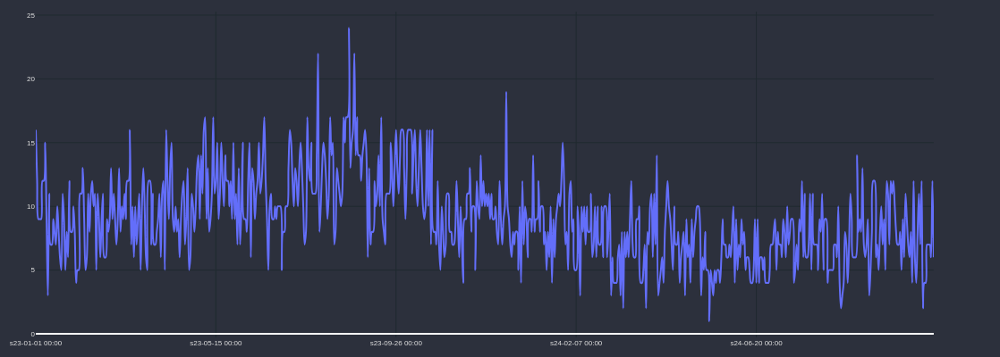

In [55]:
df_op = get_daily_operations_with_strategy(rank_dict['VIDTUSDT'].iloc[0].r)
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['operation_count'])

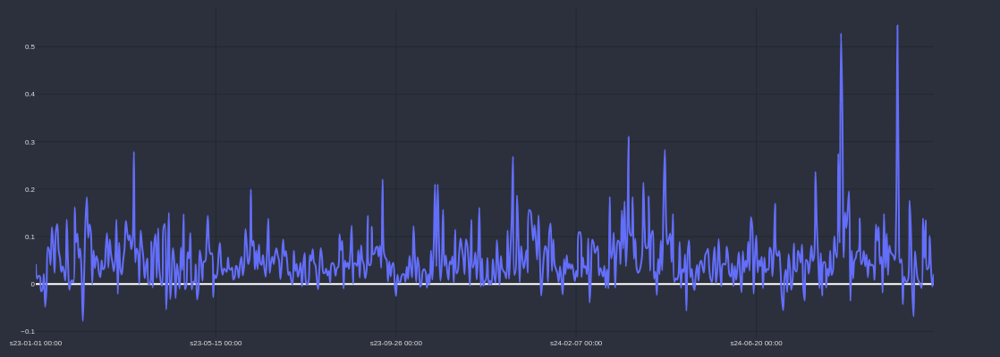

In [56]:
df_op = get_daily_operations_with_strategy(rank_dict['VIDTUSDT'].iloc[0].r)
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['total_strategy'])

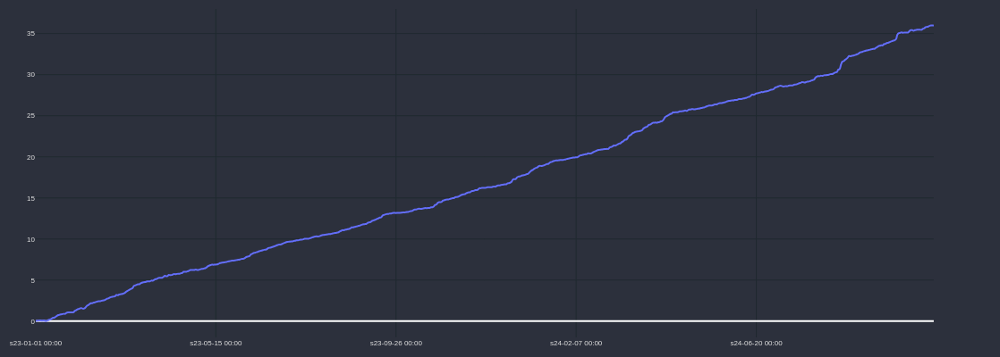

In [57]:
df_op = get_daily_operations_with_strategy(rank_dict['VIDTUSDT'].iloc[0].r)
df_op['total_strategy_sum'] = df_op.total_strategy.cumsum()
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['total_strategy_sum'])

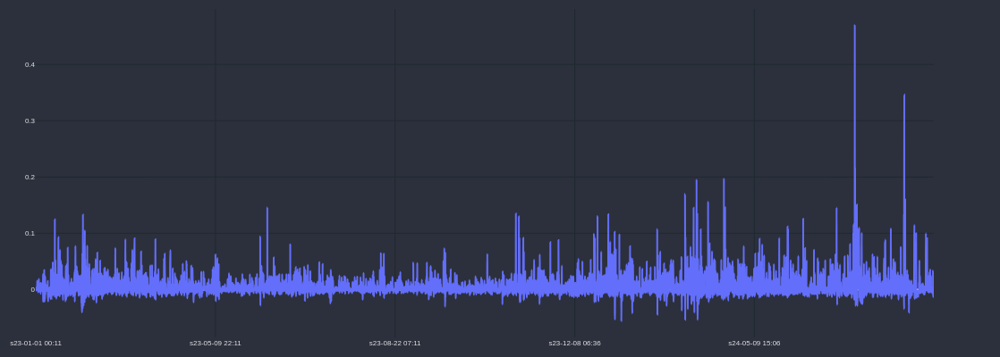

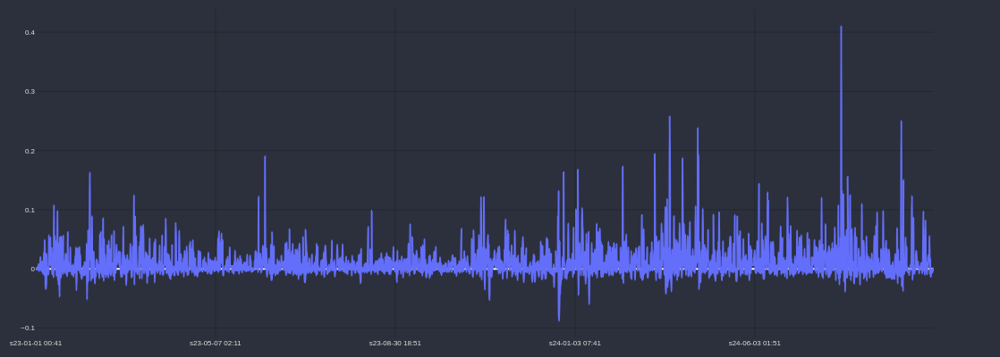

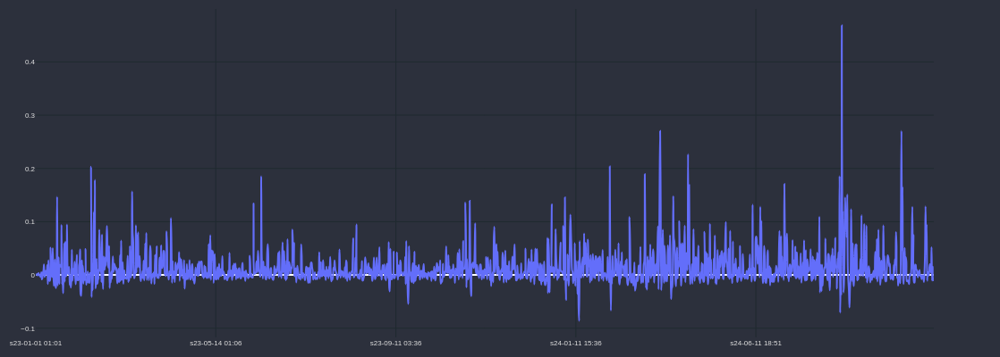

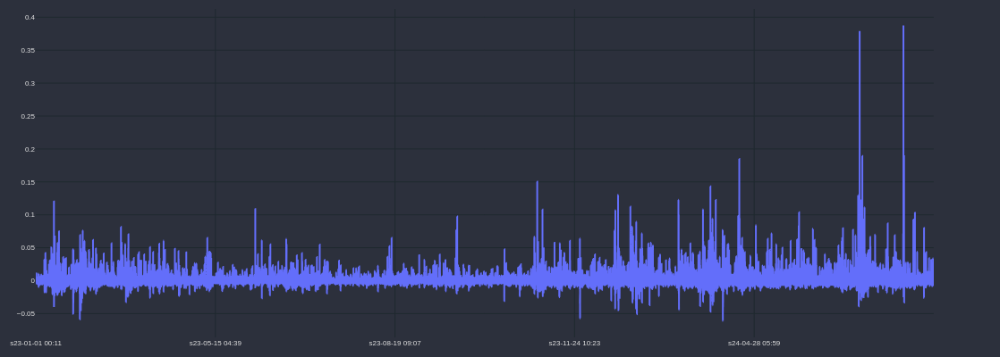

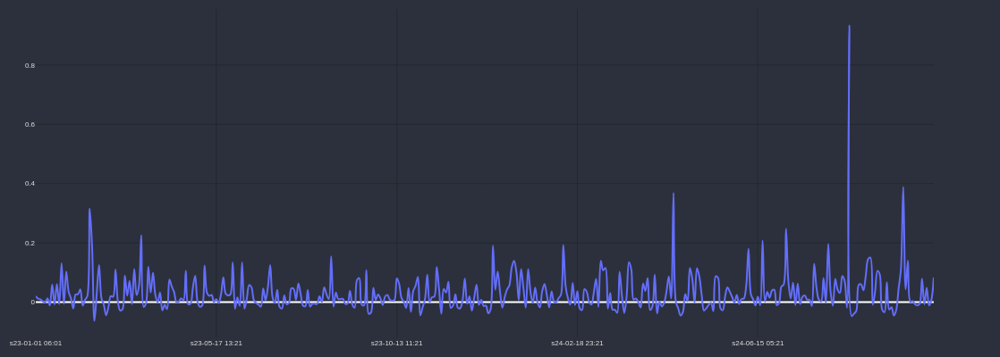

In [58]:
for index in range(len(rank_dict['VIDTUSDT'])):
    rank = rank_dict['VIDTUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

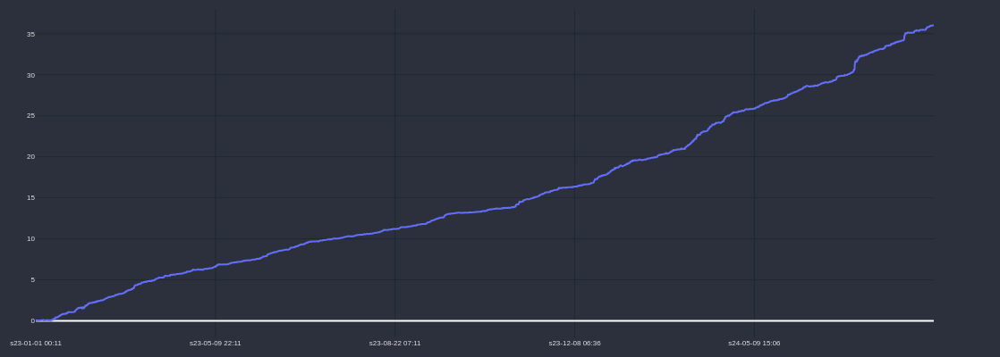

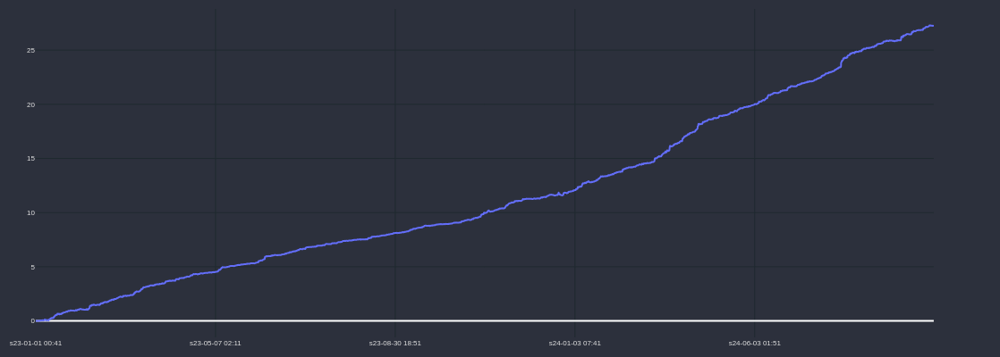

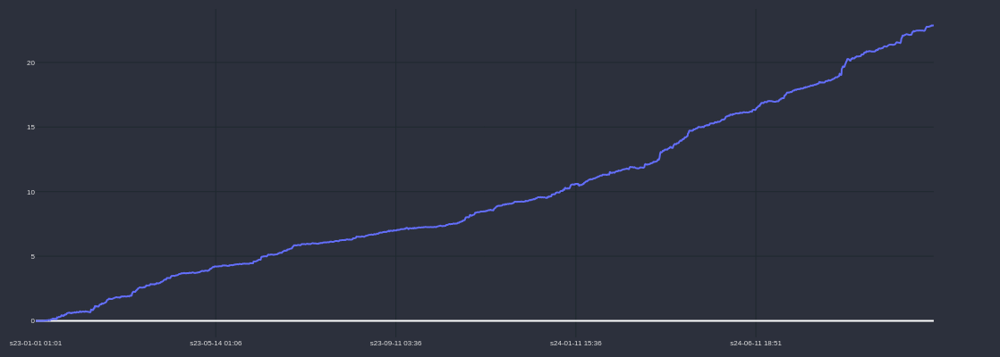

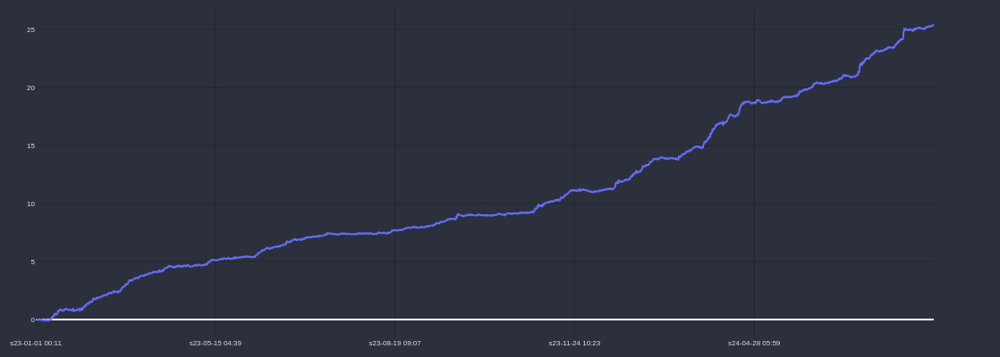

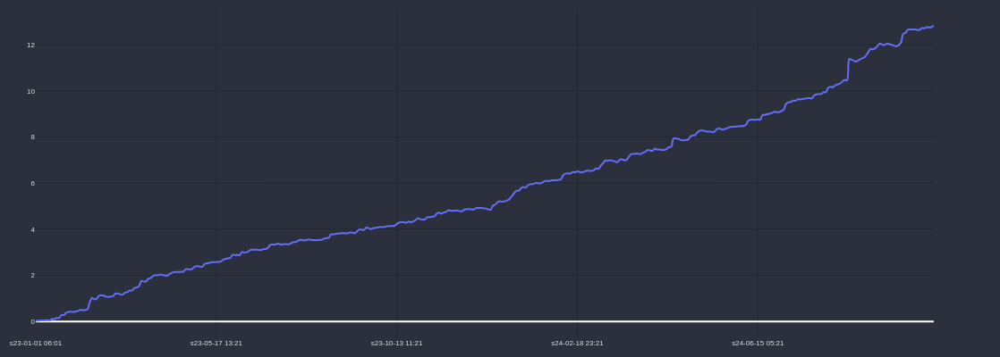

In [60]:
for index in range(len(rank_dict['VIDTUSDT'])):
    rank = rank_dict['VIDTUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy.cumsum()

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

# Alpha ACHUSDT

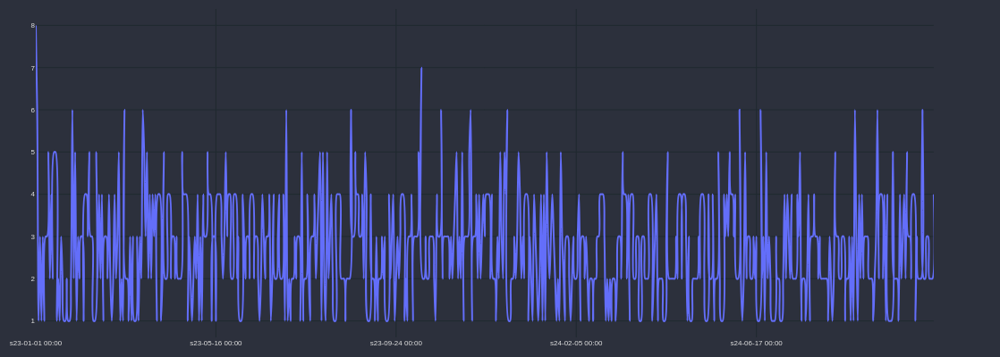

In [43]:
df_op = get_daily_operations_with_strategy(rank_dict['ACHUSDT'].iloc[0].r)
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['operation_count'])

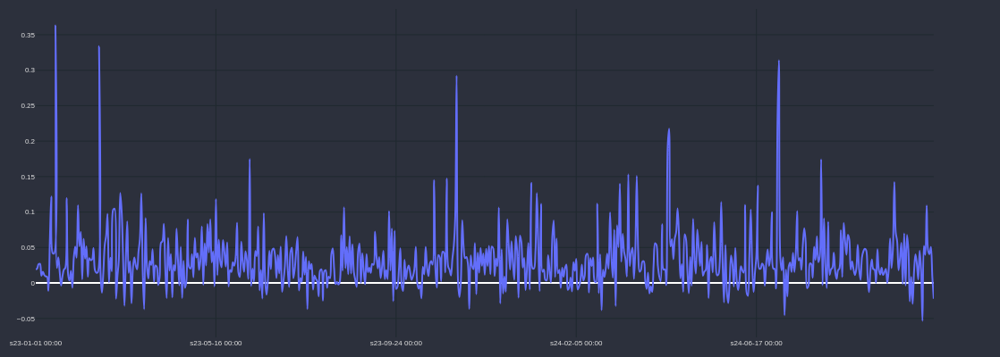

In [44]:
df_op = get_daily_operations_with_strategy(rank_dict['ACHUSDT'].iloc[0].r)
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['total_strategy'])

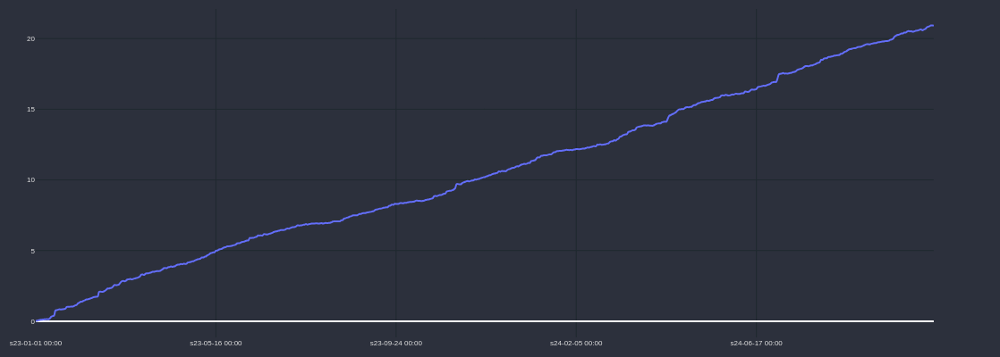

In [45]:
df_op = get_daily_operations_with_strategy(rank_dict['ACHUSDT'].iloc[0].r)
df_op['total_strategy_sum'] = df_op.total_strategy.cumsum()
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['total_strategy_sum'])

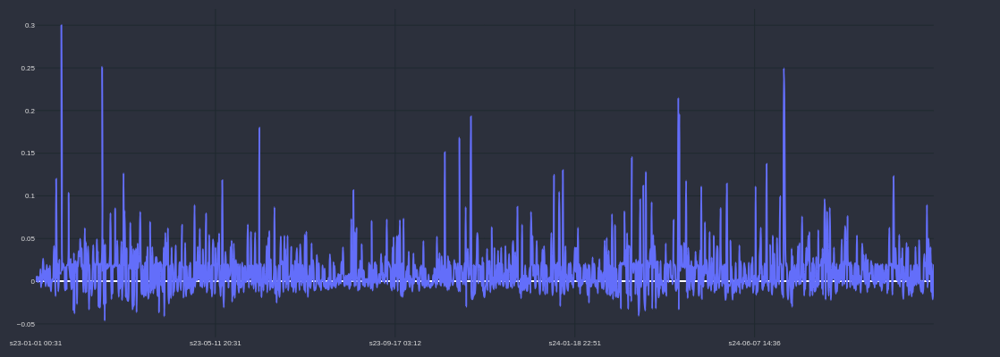

In [46]:
for index in range(len(rank_dict['ACHUSDT'])):
    rank = rank_dict['ACHUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

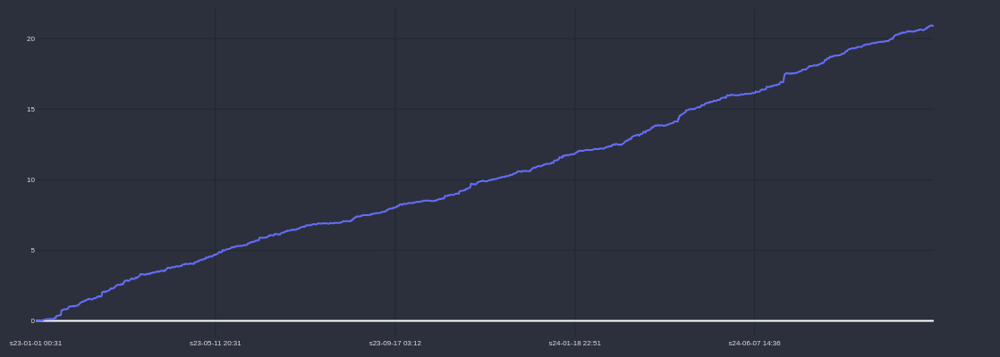

In [47]:
for index in range(len(rank_dict['ACHUSDT'])):
    rank = rank_dict['ACHUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy.cumsum()

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

# XML USDT

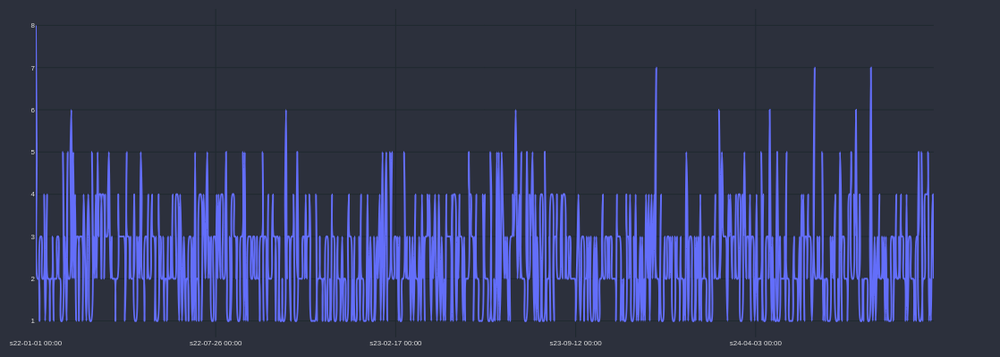

In [48]:
df_op = get_daily_operations_with_strategy(rank_dict['XLMUSDT'].iloc[0].r)
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['operation_count'])

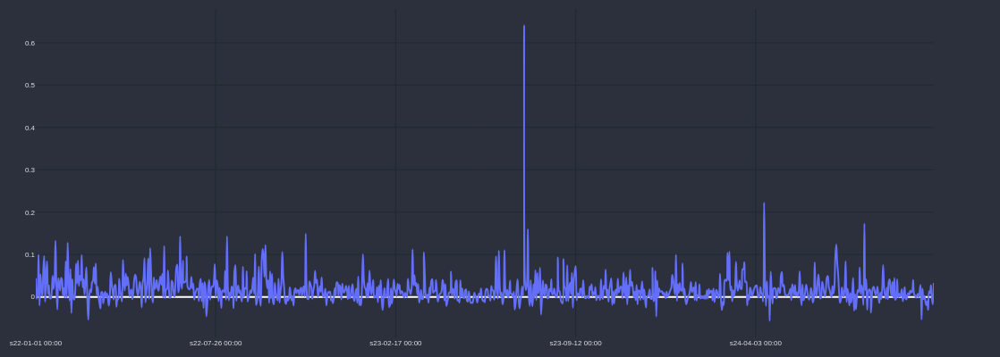

In [49]:
df_op = get_daily_operations_with_strategy(rank_dict['XLMUSDT'].iloc[0].r)
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['total_strategy'])

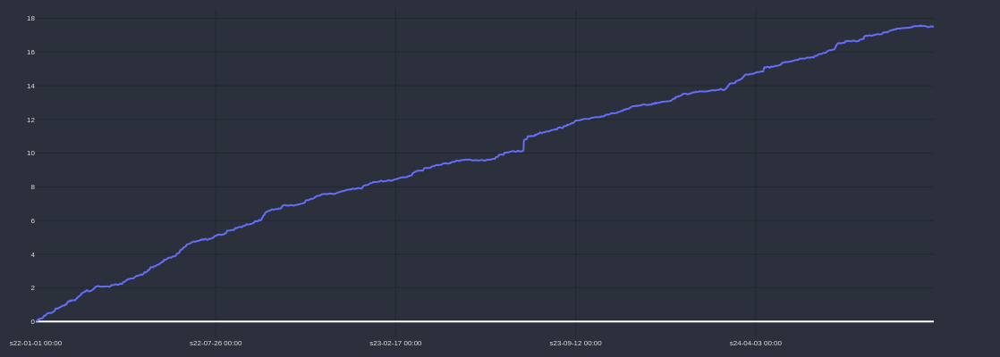

In [50]:
df_op = get_daily_operations_with_strategy(rank_dict['XLMUSDT'].iloc[0].r)
df_op['total_strategy_sum'] = df_op.total_strategy.cumsum()
cp = CandlePlot(df_op, candles=False)
cp.show_plot(line_traces = ['total_strategy_sum'])

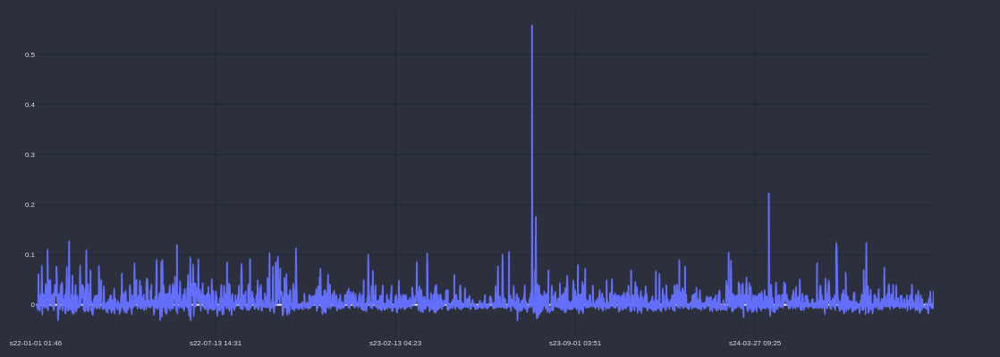

In [51]:
for index in range(len(rank_dict['XLMUSDT'])):
    rank = rank_dict['XLMUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

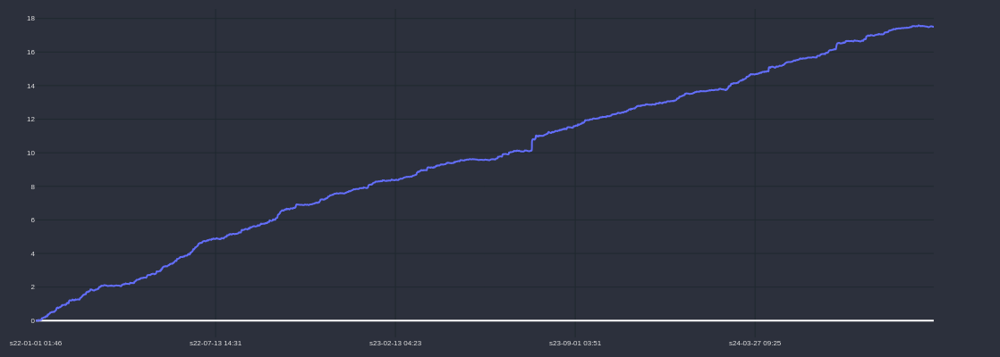

In [52]:
for index in range(len(rank_dict['XLMUSDT'])):
    rank = rank_dict['XLMUSDT'].iloc[index]
    rank.r['time'] = rank.r['end_time']
    rank.r['GAIN_I'] = rank.r.strategy.cumsum()

    cp = CandlePlot(rank.r, candles=False)
    cp.show_plot(line_traces = ['GAIN_I'])

In [53]:
def calcular_operacoes_simultaneas(df):
    # Ordena o DataFrame por start_time para facilitar o cálculo
    df = df.sort_values(by='start_time').reset_index(drop=True)
    # Inicializa a coluna operacoes_simultaneas com o valor mínimo de 0
    df['operacoes_simultaneas'] = 0
    
    # Itera sobre cada operação e conta quantas estão abertas e não fechadas no momento
    for i, row in df.iterrows():
        # Conta quantas operações estão em andamento no tempo de start_time da operação atual
        count = ((df['start_time'] <= row['start_time']) & (df['end_time'] > row['start_time'])).sum()
        # Atualiza a coluna com o número de operações simultâneas, garantindo o mínimo de 1
        df.at[i, 'operacoes_simultaneas'] = max(count, 1)
        
    return df

In [54]:

# # Concatenar os DataFrames filtrados, acessando os 10 primeiros elementos do atributo `r` de cada um
# concat_ranks = pd.concat(
#     [
#         rank_dict['VIDTUSDT'].iloc[index].r for index in range(1)
#     ]
# )


# Concatenar os DataFrames filtrados, acessando os 10 primeiros elementos do atributo `r` de cada um
concat_ranks = pd.concat(
    [
        rank_dict['VIDTUSDT'].iloc[0].r,
        # rank_dict['XLMUSDT'].iloc[0].r,
        # rank_dict['ALPHAUSDT'].iloc[0].r,
        # rank_dict['DASHUSDT'].iloc[0].r 
    ]
)


In [55]:
concat_ranks.shape

(1643, 23)

In [56]:
concat_ranks.strategy.sum()

np.float64(20.181159950791823)

In [57]:
df_test = calcular_operacoes_simultaneas(concat_ranks)
df_test.operacoes_simultaneas.max()

np.int64(1)

In [58]:
df_test.tail()

,running,tp,sl,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
1638,False,0.03,0.03,961560,136,0,-0.010711,0,2,False,0,0.03,-0.030000,sell,0.02767,0.02794,0,1,-0.00027,2024-10-29 21:36:00,2024-10-29 19:21:00,2024-10-29 21:36:00,-0.010711,1
1639,False,0.03,0.03,961695,334,0,0.018143,0,1,False,1,0.06,0.020211,buy,0.02794,0.02848,1,0,0.00054,2024-10-30 03:09:00,2024-10-29 21:36:00,2024-10-30 03:09:00,0.018143,1
1640,False,0.03,0.03,962550,121,0,-0.009761,0,2,False,0,0.03,-0.030000,sell,0.02841,0.02866,0,1,-0.00025,2024-10-30 13:51:00,2024-10-30 11:51:00,2024-10-30 13:51:00,-0.009761,1
1641,False,0.03,0.03,962670,301,0,-0.010113,0,2,False,0,0.03,-0.030000,buy,0.02866,0.02840,1,0,-0.00026,2024-10-30 18:51:00,2024-10-30 13:51:00,2024-10-30 18:51:00,-0.010113,1
1642,False,0.03,0.03,962970,697,0,0.023235,0,1,False,1,0.06,0.028781,sell,0.02840,0.02772,0,1,0.00068,2024-10-31 06:27:00,2024-10-30 18:51:00,2024-10-31 06:27:00,0.023235,1


In [59]:
concat_ranks.columns

Index(['running', 'tp', 'sl', 'start_index_m5', 'count', 'trigger_type',
       'strategy', 'strategy_no_tc', 'total_opened', 'first_return',
       'trail_stop_trigger', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'time', 'GAIN_I'],
      dtype='object')

In [60]:
df_test.strategy.sum()

np.float64(20.181159950791823)

In [61]:
(5000/df_test.operacoes_simultaneas.max()) * df_test.strategy.sum()

np.float64(100905.79975395912)

In [62]:
df_test.tail()

,running,tp,sl,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
1638,False,0.03,0.03,961560,136,0,-0.010711,0,2,False,0,0.03,-0.030000,sell,0.02767,0.02794,0,1,-0.00027,2024-10-29 21:36:00,2024-10-29 19:21:00,2024-10-29 21:36:00,-0.010711,1
1639,False,0.03,0.03,961695,334,0,0.018143,0,1,False,1,0.06,0.020211,buy,0.02794,0.02848,1,0,0.00054,2024-10-30 03:09:00,2024-10-29 21:36:00,2024-10-30 03:09:00,0.018143,1
1640,False,0.03,0.03,962550,121,0,-0.009761,0,2,False,0,0.03,-0.030000,sell,0.02841,0.02866,0,1,-0.00025,2024-10-30 13:51:00,2024-10-30 11:51:00,2024-10-30 13:51:00,-0.009761,1
1641,False,0.03,0.03,962670,301,0,-0.010113,0,2,False,0,0.03,-0.030000,buy,0.02866,0.02840,1,0,-0.00026,2024-10-30 18:51:00,2024-10-30 13:51:00,2024-10-30 18:51:00,-0.010113,1
1642,False,0.03,0.03,962970,697,0,0.023235,0,1,False,1,0.06,0.028781,sell,0.02840,0.02772,0,1,0.00068,2024-10-31 06:27:00,2024-10-30 18:51:00,2024-10-31 06:27:00,0.023235,1


In [63]:
df_test.describe()

,tp,sl,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
count,1.643000e+03,1.643000e+03,1643.000000,1643.000000,1643.0,1643.000000,1643.0,1643.000000,1643.000000,1643.000000,1643.000000,1643.000000,1643.000000,1643.000000,1643.000000,1643.000000,1643,1643,1643,1643.000000,1643.0
mean,3.000000e-02,3.000000e-02,465639.513086,436.676202,0.0,0.012283,0.0,1.678637,0.420572,0.054084,-0.004393,0.029905,0.029919,0.499696,0.500304,0.000418,2023-11-20 17:05:57.845404672,2023-11-20 09:50:14.351795200,2023-11-20 17:05:57.845404672,0.012283,1.0
min,3.000000e-02,3.000000e-02,15.000000,10.000000,0.0,-0.079982,0.0,1.000000,0.000000,0.030000,-0.030000,0.014490,0.014130,0.000000,0.000000,-0.002610,2023-01-01 01:01:00,2023-01-01 00:16:00,2023-01-01 01:01:00,-0.079982,1.0
25%,3.000000e-02,3.000000e-02,229447.500000,154.000000,0.0,-0.004572,0.0,1.000000,0.000000,0.030000,-0.030000,0.021510,0.021535,0.000000,0.000000,-0.000090,2023-06-09 13:13:30,2023-06-09 09:28:30,2023-06-09 13:13:30,-0.004572,1.0
50%,3.000000e-02,3.000000e-02,447420.000000,316.000000,0.0,0.006365,0.0,2.000000,0.000000,0.030000,-0.030000,0.029610,0.029620,0.000000,1.000000,0.000180,2023-11-07 22:06:00,2023-11-07 18:21:00,2023-11-07 22:06:00,0.006365,1.0
75%,3.000000e-02,3.000000e-02,698332.500000,601.000000,0.0,0.020217,0.0,2.000000,1.000000,0.060000,0.020878,0.036215,0.036285,1.000000,1.000000,0.000700,2024-04-30 12:06:00,2024-04-30 00:13:30,2024-04-30 12:06:00,0.020217,1.0
max,3.000000e-02,3.000000e-02,962970.000000,2548.000000,0.0,0.468703,0.0,2.000000,1.000000,0.960000,0.321776,0.060620,0.063210,1.000000,1.000000,0.014940,2024-10-31 06:27:00,2024-10-30 18:51:00,2024-10-31 06:27:00,0.468703,1.0
std,1.388201e-17,1.388201e-17,276862.988020,398.719095,0.0,0.029624,0.0,0.467142,0.493801,0.051079,0.033484,0.009777,0.009764,0.500152,0.500152,0.001065,NaN,NaN,NaN,0.029624,0.0


In [64]:
df_test = df_test.sort_values(by='end_time', ascending=True).reset_index(drop=True)
df_test.head()

,running,tp,sl,start_index_m5,count,trigger_type,strategy,strategy_no_tc,total_opened,first_return,trail_stop_trigger,trailing_stop_target,trailing_stop_loss,type,start_price,trigger_price,SIGNAL_UP,SIGNAL_DOWN,result,end_time,start_time,time,GAIN_I,operacoes_simultaneas
0,False,0.03,0.03,15,46,0,-0.000610,0,2,False,0,0.03,-0.03,sell,0.02563,0.02562,0,1,0.00001,2023-01-01 01:01:00,2023-01-01 00:16:00,2023-01-01 01:01:00,-0.000610,1
1,False,0.03,0.03,60,16,0,0.000950,0,2,False,0,0.03,-0.03,buy,0.02562,0.02567,1,0,0.00005,2023-01-01 01:16:00,2023-01-01 01:01:00,2023-01-01 01:16:00,0.000950,1
2,False,0.03,0.03,75,16,0,-0.000221,0,2,False,0,0.03,-0.03,sell,0.02567,0.02565,0,1,0.00002,2023-01-01 01:31:00,2023-01-01 01:16:00,2023-01-01 01:31:00,-0.000221,1
3,False,0.03,0.03,90,16,0,0.001725,0,2,False,0,0.03,-0.03,buy,0.02565,0.02572,1,0,0.00007,2023-01-01 01:46:00,2023-01-01 01:31:00,2023-01-01 01:46:00,0.001725,1
4,False,0.03,0.03,105,31,0,-0.000611,0,2,False,0,0.03,-0.03,sell,0.02572,0.02571,0,1,0.00001,2023-01-01 02:16:00,2023-01-01 01:46:00,2023-01-01 02:16:00,-0.000611,1


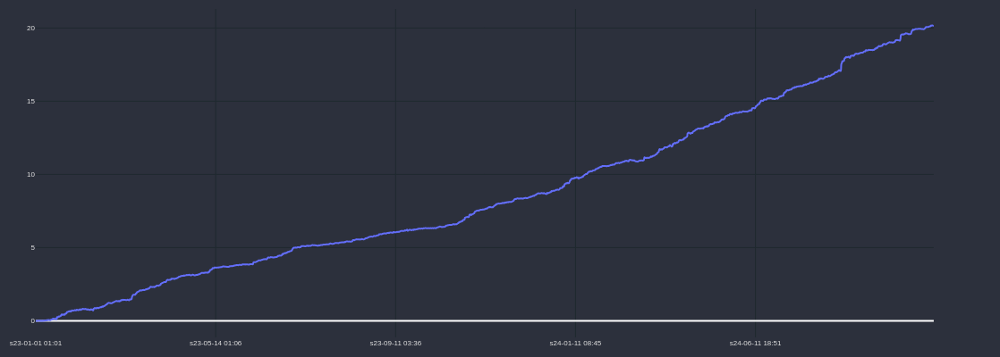

In [65]:

df_test['time'] = df_test['end_time']
df_test['GAIN_C'] = df_test.strategy.cumsum()

cp = CandlePlot(df_test, candles=False)
cp.show_plot(line_traces = ['GAIN_C'])#, sec_traces=['operacoes_simultaneas'])

In [66]:
pos = df_test[df_test['strategy']>0]
neg = df_test[df_test['strategy']<0]

print(len(pos),len(neg), len(pos)/(len(pos)+len(neg)))

1042 601 0.6342057212416312


In [67]:
df_test.columns

Index(['running', 'tp', 'sl', 'start_index_m5', 'count', 'trigger_type',
       'strategy', 'strategy_no_tc', 'total_opened', 'first_return',
       'trail_stop_trigger', 'trailing_stop_target', 'trailing_stop_loss',
       'type', 'start_price', 'trigger_price', 'SIGNAL_UP', 'SIGNAL_DOWN',
       'result', 'end_time', 'start_time', 'time', 'GAIN_I',
       'operacoes_simultaneas', 'GAIN_C'],
      dtype='object')

In [68]:
import numpy as np
import pandas as pd

def calcular_retorno_dinamico_com_alavancagem(df, saldo_total, alavancagem=1, percentual_capital=10):
    """
    Calcula o retorno acumulado em dólar com controle de reserva, considerando operações simultâneas e mantendo
    o saldo total inalterado até que as operações sejam fechadas. Adiciona incremento de 2% ao capital usado.

    Parâmetros:
        df (pd.DataFrame): DataFrame contendo as colunas `start_time`, `end_time`, e `strategy`.
        saldo_total (float): Saldo total inicial disponível para operações.
        alavancagem (float): Fator de alavancagem a ser aplicado nas operações.
        percentual_capital (float): Percentual do saldo total a ser usado em cada operação.

    Retorno:
        pd.DataFrame: DataFrame atualizado com colunas adicionais e métricas.
    """
    # Ordenar o DataFrame pelo tempo de abertura
    df = df.sort_values(by="start_time").reset_index(drop=True)

    # Inicializar arrays e variáveis
    n = len(df)
    capital_usado = saldo_total / percentual_capital
    incremento_percentual = 0.0

    status = np.full(n, "fechada", dtype=object)
    retorno_dolar = np.zeros(n)
    capital_acumulado = np.full(n, saldo_total)
    saldo_total_arr = np.full(n, saldo_total)
    capital_usado_arr = np.zeros(n)

    for i in range(n):
        # Fechar operações cujo end_time já passou
        abertas = (status == "aberta") & (df["end_time"].values <= df["start_time"].iloc[i])
        for j in np.where(abertas)[0]:
            retorno_alavancado = alavancagem * (df["strategy"].iloc[j] * capital_usado_arr[j])
            saldo_total += retorno_alavancado  # Atualizar saldo total com o retorno da operação
            retorno_dolar[j] = retorno_alavancado
            status[j] = "fechada"
            # Recalcular o capital usado após fechar uma operação
            capital_usado = saldo_total / percentual_capital

        # Incrementar o capital usado em 2% para a nova operação
        capital_usado *= (1 + incremento_percentual)
        capital_usado_arr[i] = capital_usado

        # Marcar a operação como aberta
        status[i] = "aberta"

        # Atualizar o saldo acumulado e saldo total
        saldo_total_arr[i] = saldo_total
        capital_acumulado[i] = saldo_total

    # Adicionar os resultados ao DataFrame
    df["capital_usado"] = capital_usado_arr
    df["retorno_dolar"] = retorno_dolar
    df["capital_acumulado"] = capital_acumulado
    df["saldo_total"] = saldo_total_arr
    df["status"] = status

    print("Resumo Final:")
    print(f"Saldo total final: ${saldo_total:.2f}")
    return df


In [69]:
df_test.operacoes_simultaneas.mean()

np.float64(1.0)

In [71]:
# valor_inicial = 5.0
saldo_total = 140.0

# Exemplo de uso com alavancagem
df_resultado_dinamico_alavancagem = calcular_retorno_dinamico_com_alavancagem(
    df_test, saldo_total, alavancagem=1, percentual_capital=1
)

Resumo Final:
Saldo total final: $36510124480.99


In [72]:
df_test.strategy.sum()

np.float64(20.181159950791823)

In [73]:
df_resultado_dinamico_alavancagem[["start_time", "end_time", "strategy", "capital_usado", "retorno_dolar",
              "capital_acumulado", "saldo_total"]].head(250)

,start_time,end_time,strategy,capital_usado,retorno_dolar,capital_acumulado,saldo_total
0,2023-01-01 00:16:00,2023-01-01 01:01:00,-0.000610,140.000000,-0.085366,140.000000,140.000000
1,2023-01-01 01:01:00,2023-01-01 01:16:00,0.000950,139.914634,0.132877,139.914634,139.914634
2,2023-01-01 01:16:00,2023-01-01 01:31:00,-0.000221,140.047511,-0.030891,140.047511,140.047511
3,2023-01-01 01:31:00,2023-01-01 01:46:00,0.001725,140.016620,0.241575,140.016620,140.016620
4,2023-01-01 01:46:00,2023-01-01 02:16:00,-0.000611,140.258194,-0.085715,140.258194,140.258194
5,2023-01-01 02:16:00,2023-01-01 02:46:00,0.003269,140.172479,0.458275,140.172479,140.172479
6,2023-01-01 02:46:00,2023-01-01 03:01:00,0.000550,140.630754,0.077401,140.630754,140.630754
7,2023-01-01 03:01:00,2023-01-01 03:16:00,0.000163,140.708156,0.022938,140.708156,140.708156
8,2023-01-01 03:16:00,2023-01-01 03:46:00,-0.002549,140.731093,-0.358665,140.731093,140.731093
9,2023-01-01 03:46:00,2023-01-01 05:16:00,-0.003324,140.372428,-0.466567,140.372428,140.372428


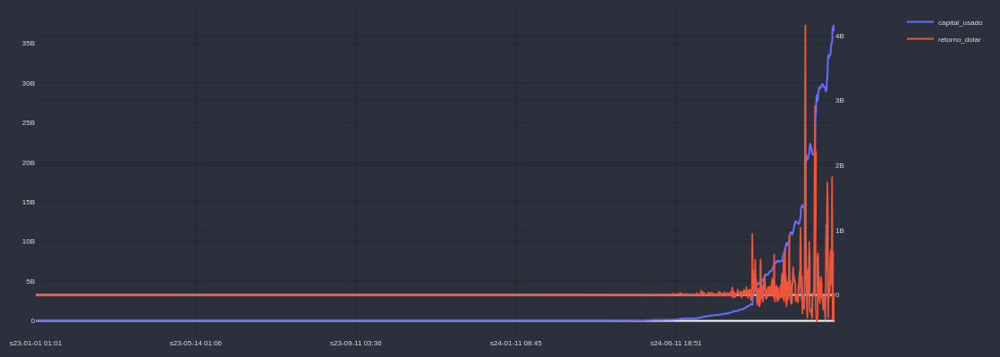

In [74]:
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_usado'], sec_traces=['retorno_dolar'])

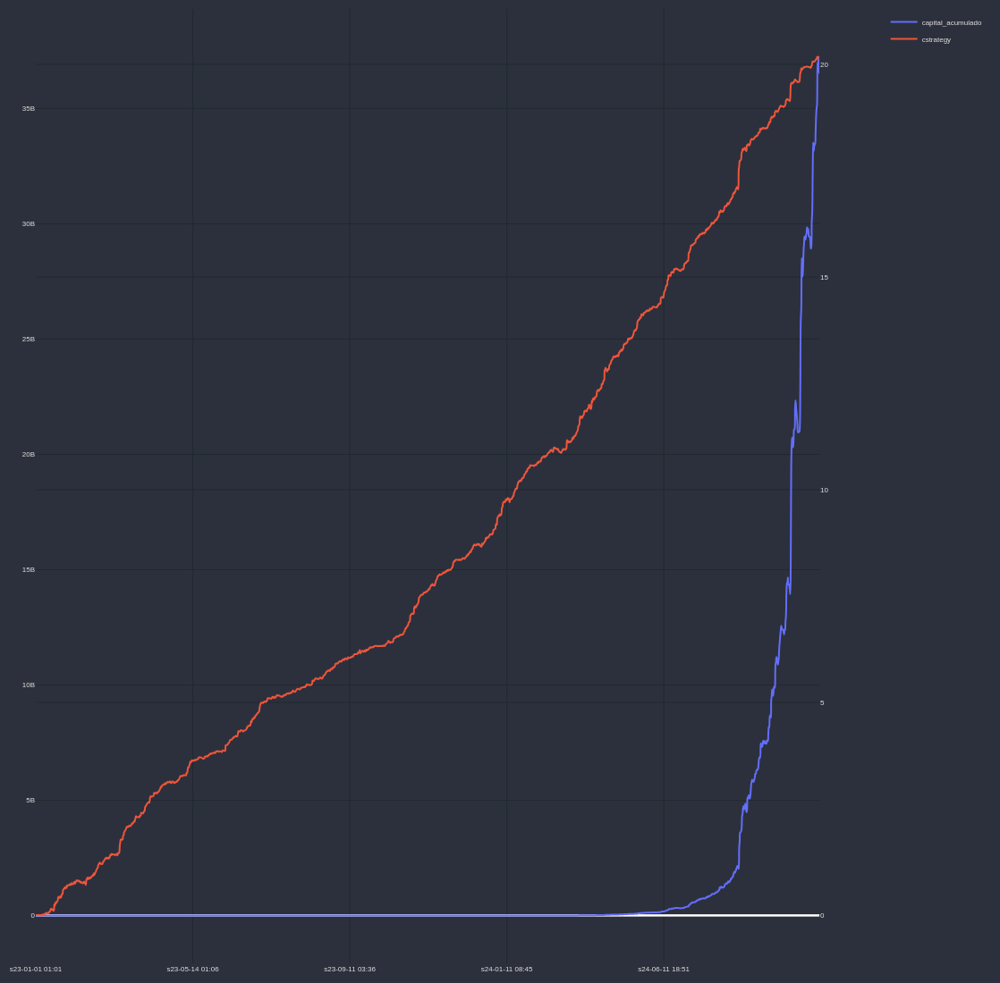

In [75]:
df_resultado_dinamico_alavancagem['cstrategy'] = df_resultado_dinamico_alavancagem.strategy.cumsum()
cp = CandlePlot(df_resultado_dinamico_alavancagem, candles=False)
cp.show_plot(line_traces = ['capital_acumulado'], sec_traces=['cstrategy'], height=1100)